In [1]:
import os, re
import random, math
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

c:\Users\Desk_Kang\anaconda3\envs\pyenv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
(raw_train, raw_val, raw_test), info = tfds.load('tf_flowers', split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'], download=True, with_info=True)

In [3]:
#사진 데이터 불러와서 train, validation, test 로 나누어 저장함

In [4]:
print(raw_train)
print(raw_val)
print(raw_test)

<PrefetchDataset element_spec={'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>
<PrefetchDataset element_spec={'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>
<PrefetchDataset element_spec={'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>


In [5]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


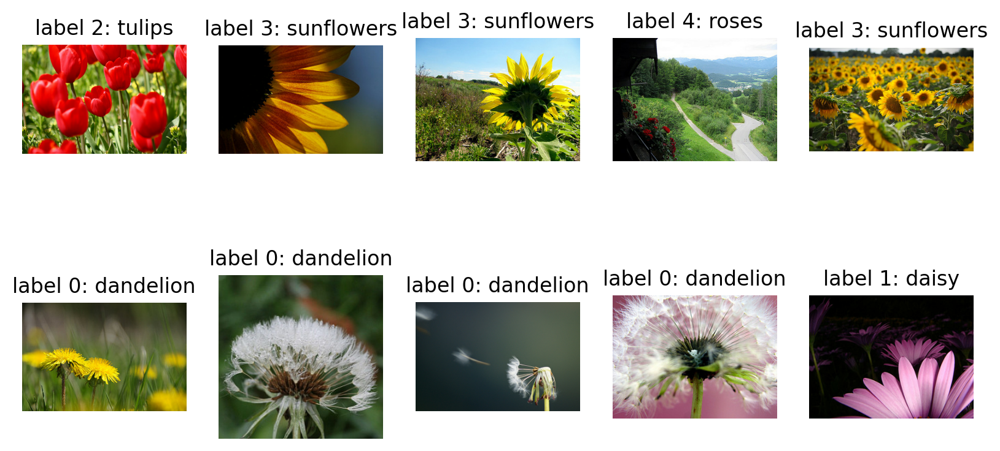

In [6]:
plt.figure(figsize=(10, 5))

get_label_name = info.features['label'].int2str

for idx, data in enumerate(raw_train.take(10)):
    image = data['image']
    label = data['label']

    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

plt.show()

In [7]:
IMG_SIZE = 220 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5)-1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label


In [8]:
#이미지 픽셀의 데이터는 0~255 숫자를 가지고 있어 /255 혹은 (/127.5)-1 스케일링함
#여기서는 후자 선택

In [9]:
train = raw_train.map(lambda x: format_example(x['image'], x['label']))
validation = raw_val.map(lambda x: format_example(x['image'], x['label']))
test = raw_test.map(lambda x: format_example(x['image'], x['label']))

print(train)
print(validation)
print(test)

<MapDataset element_spec=(TensorSpec(shape=(220, 220, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(220, 220, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(220, 220, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [10]:
#데이터와 라벨링 작업

In [11]:
print(len(train))
print(len(test))
print(len(validation))

2936
367
367


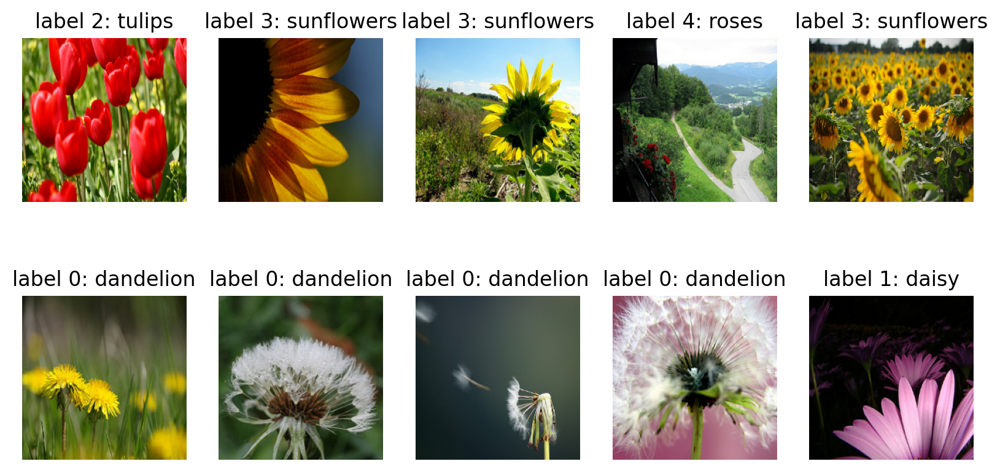

In [12]:
plt.figure(figsize=(10, 5))


get_label_name = info.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [13]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

base_model = tf.keras.applications.VGG19(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [14]:
BATCH_SIZE = 32
# SHUFFLE_BUFFER_SIZE_T = 1050
SHUFFLE_BUFFER_SIZE_A = 1050

In [15]:
#shuffle buffer size가 원 데이터의 10%~100%가 적당하다는데
#pneu에서는 훨씬 큰 숫자를 줘야 했음
#여기선 30%정도 부여

In [16]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
# 데이터 로드할 때 빠르게 로드할 수 있도록하는 설정 변수

In [17]:
def augment(image,label):
    image = tf.image.random_flip_left_right(image)  # 랜덤하게 좌우를 반전합니다.
    return image,label

In [18]:
#데이터 파이프라인
#shuffle 무작위 요소 선택
#repeat 여러번 데이터셋을 사용할 수 있게 만듬
#batch 배치사이즈에 맞게 데이터 나눔

def prepare_for_training(ds, shuffle_buffer_size):
    # augment 적용 부분이 배치처리 함수에 추가되었습니다.
    ds = ds.map(
            augment,       # augment 함수 적용(좌우반전)
            num_parallel_calls=2
        )
    ds = ds.shuffle(buffer_size=shuffle_buffer_size)
    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

train_ds = prepare_for_training(train, 4500)
val_ds = prepare_for_training(validation, 1050)

In [19]:
# train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE_T).batch(BATCH_SIZE)
# validation_batches = validation.shuffle(SHUFFLE_BUFFER_SIZE_A).batch(BATCH_SIZE)
test_batches = test.shuffle(SHUFFLE_BUFFER_SIZE_A).batch(BATCH_SIZE)

In [20]:
base_model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 220, 220, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 220, 220, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 220, 220, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 110, 110, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 110, 110, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 110, 110, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 55, 55, 128)       0     

In [21]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [22]:
dense_layer = tf.keras.layers.Dense(1024, activation='relu')
dropout_layer = tf.keras.layers.Dropout(0.3)
dense_layer2 = tf.keras.layers.Dense(512, activation='relu')
dense_layer3 = tf.keras.layers.Dense(512, activation='relu')

In [23]:
#layer를 더 쌓으면 학습데이터에 맞출 수 있을까 해서
#3개 쌓아봄

In [24]:
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

In [25]:
base_model.trainable = False

In [26]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  dropout_layer,
  dense_layer2,
  dense_layer3,
  prediction_layer
])

In [27]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 6, 6, 512)         20024384  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 1024)              525312    
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 512)               262656    
                                                        

In [28]:
learning_rate = 0.0001
EPOCHS = 35
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [29]:
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("flowers_model.h5",
                                                    save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=5,
                                                     restore_best_weights=True)

In [30]:
history = model.fit(train_ds,
                    epochs=EPOCHS,
                    validation_data=val_ds,
                    callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/35
92/92 [==============================] - 28s 195ms/step - loss: 1.2681 - accuracy: 0.5228 - val_loss: 0.9276 - val_accuracy: 0.6267
Epoch 2/35
92/92 [==============================] - 12s 122ms/step - loss: 0.8403 - accuracy: 0.6965 - val_loss: 0.7690 - val_accuracy: 0.7466
Epoch 3/35
92/92 [==============================] - 12s 122ms/step - loss: 0.7083 - accuracy: 0.7343 - val_loss: 0.6713 - val_accuracy: 0.7602
Epoch 4/35
92/92 [==============================] - 12s 120ms/step - loss: 0.6344 - accuracy: 0.7640 - val_loss: 0.5876 - val_accuracy: 0.8038
Epoch 5/35
92/92 [==============================] - 12s 120ms/step - loss: 0.5844 - accuracy: 0.7953 - val_loss: 0.5498 - val_accuracy: 0.8011
Epoch 6/35
92/92 [==============================] - 12s 119ms/step - loss: 0.5444 - accuracy: 0.8031 - val_loss: 0.5755 - val_accuracy: 0.7902
Epoch 7/35
92/92 [==============================] - 12s 118ms/step - loss: 0.5110 - accuracy: 0.8089 - val_loss: 0.5897 - val_accuracy: 0.7847

In [31]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

1/1 [==============================] - 0s 208ms/step


array([[4.46780687e-05, 2.26331504e-05, 9.99580085e-01, 4.37644485e-06,
        3.48235655e-04],
       [2.14726868e-04, 5.61892703e-05, 9.60878730e-01, 2.00002818e-04,
        3.86503786e-02],
       [3.78863029e-02, 1.78961810e-02, 9.01936293e-01, 4.25218092e-03,
        3.80291454e-02],
       [6.44384231e-03, 4.17890493e-03, 2.44650291e-04, 9.88663375e-01,
        4.69133811e-04],
       [1.08340986e-01, 8.06041062e-01, 1.67053577e-03, 8.13548937e-02,
        2.59256084e-03],
       [1.75913228e-05, 6.34502067e-06, 7.58868828e-06, 9.99965668e-01,
        2.72423222e-06],
       [5.36999396e-05, 9.83518767e-05, 2.99774972e-03, 3.29876272e-03,
        9.93551373e-01],
       [1.70071638e-04, 2.66839343e-04, 9.91460204e-01, 1.43349404e-04,
        7.95942172e-03],
       [5.36404434e-04, 3.26117687e-02, 5.19283116e-04, 9.66310680e-01,
        2.17241140e-05],
       [4.72210914e-01, 3.56751204e-01, 1.47140608e-03, 1.61450386e-01,
        8.11605621e-03],
       [8.57519917e-03, 1.1481

In [32]:
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 2, 2, 3, 1, 3, 4, 2, 3, 0, 3, 3, 1, 2, 2, 1, 0, 4, 4, 3, 2, 2,
       0, 3, 2, 2, 3, 0, 4, 1, 3, 2], dtype=int64)

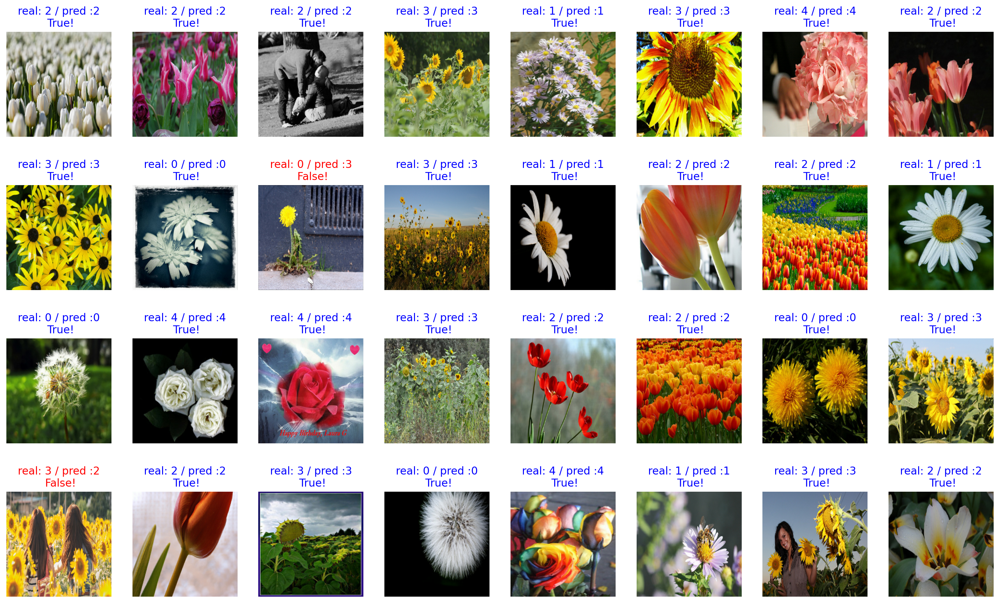

In [33]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [34]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

93.75


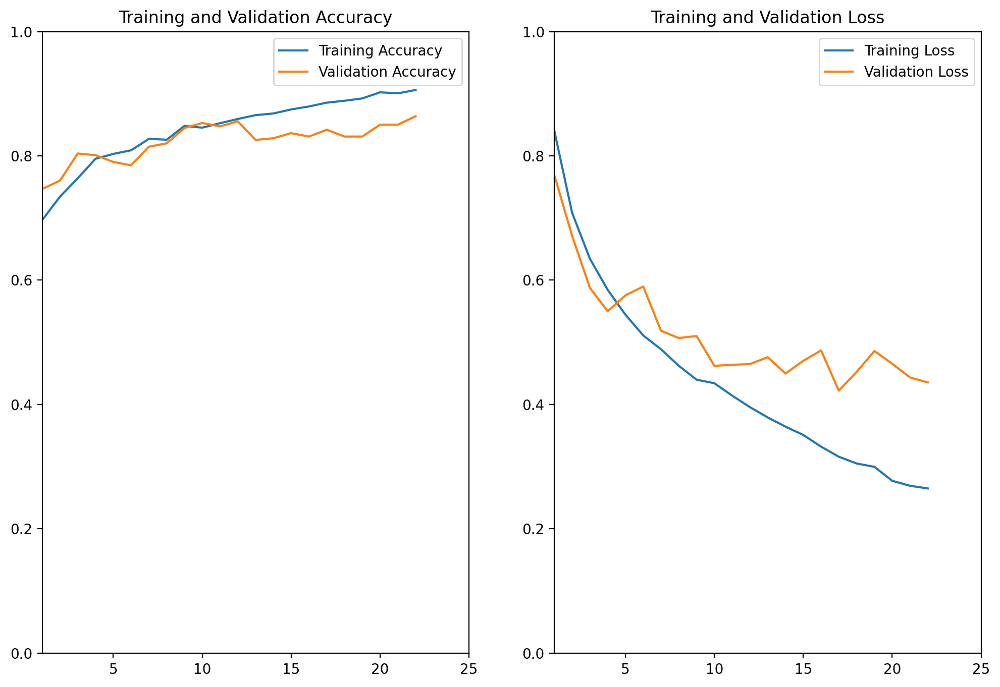

In [36]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(23)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.ylim([0, 1])
plt.xlim([1, 25])

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.ylim([0, 1])
plt.xlim([1, 25])

plt.show()

In [37]:
test_loss, test_accuracy = model.evaluate(test_batches)

12/12 [==============================] - 2s 105ms/step - loss: 0.3818 - accuracy: 0.8747


In [38]:
print(f'Loss: {test_loss},\nAccuracy: {test_accuracy}')

Loss: 0.38182196021080017,
Accuracy: 0.8746594190597534


In [1]:
# test_accuracy가 약 0.874으로 87% 정확도를 보여줌
# shuffle buffer size를 원 data크기에 3배정도 부여